# MLP simples

In [10]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

Datasets = []
PREDICTORS = ["PwmD", "PwmE"]   
TARGET = ["Theta", "X", "Y"]       
TIME_STEPS = 3

for i in range(3):   
    Dataset = pd.read_csv(f"../Dados/Data{i + 1}.csv")
        
    # Ajusta índice pelo tempo
    Dataset.index = (np.arange(0, len(Dataset), 1).astype(float) * 0.07).round(5)
    
    Datasets.append(Dataset)
    
    print(f"++++++++++++++++++++ Dataset {i+1} +++++++++++++++++++++++")
    print(Dataset.head(5))


++++++++++++++++++++ Dataset 1 +++++++++++++++++++++++
        X    Y  Theta    Wd   We  WdRef  WeRef   PwmD   PwmE
0.00  0.0  0.7   0.00  0.00  0.0  -0.00   0.00  -0.00   0.00
0.07  0.0  0.7   0.00  0.00  0.0   3.02   3.02  -0.00   0.00
0.14  0.0  0.7   0.00  0.00  0.0   3.02   3.02  45.32  45.32
0.21  0.0  0.7   0.01  0.36  0.0   3.02   3.02  45.32  45.32
0.28  0.0  0.7   0.01  0.20  0.0   2.99   3.02  57.60  63.38
++++++++++++++++++++ Dataset 2 +++++++++++++++++++++++
        X    Y  Theta    Wd   We  WdRef  WeRef   PwmD   PwmE
0.00  0.0  0.7    0.0  0.00  0.0  -0.00   0.00  -0.00   0.00
0.07  0.0  0.7    0.0  0.00  0.0   3.02   3.02  -0.00   0.00
0.14  0.0  0.7    0.0  0.00  0.0   3.02   3.02  45.32  45.32
0.21  0.0  0.7    0.0  0.03  0.0   3.02   3.02  45.32  45.32
0.28  0.0  0.7    0.0  0.00  0.0   3.02   3.02  63.00  63.44
++++++++++++++++++++ Dataset 3 +++++++++++++++++++++++
        X    Y  Theta   Wd   We  WdRef  WeRef   PwmD   PwmE
0.00  0.0  0.7    0.0  0.0  0.0  -0.00   0.

In [11]:
NormDatasets = []

SCALER = StandardScaler()
OUT_SCALER = StandardScaler()

TrainDataset = Datasets[0]
TrainDataset[PREDICTORS] = SCALER.fit_transform(TrainDataset[PREDICTORS])
TrainDataset[TARGET] = OUT_SCALER.fit_transform(TrainDataset[TARGET])
NormDatasets.append(TrainDataset)

for i in range(2):
      CurrentTestDataset = Datasets[i + 1]
      CurrentTestDataset[PREDICTORS] = SCALER.transform(CurrentTestDataset[PREDICTORS])
      CurrentTestDataset[TARGET] = OUT_SCALER.transform(CurrentTestDataset[TARGET])
      NormDatasets.append(CurrentTestDataset)
      print(f"++++++++++++++++++++ Dataset Normalizado {i+1} +++++++++++++++++++++++")
      print(NormDatasets[i].head(5))

++++++++++++++++++++ Dataset Normalizado 1 +++++++++++++++++++++++
             X         Y     Theta    Wd   We  WdRef  WeRef      PwmD  \
0.00 -1.709302  1.484089 -0.359558  0.00  0.0  -0.00   0.00  0.464323   
0.07 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  0.464323   
0.14 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  1.082441   
0.21 -1.709302  1.484089 -0.342096  0.36  0.0   3.02   3.02  1.082441   
0.28 -1.709302  1.484089 -0.342096  0.20  0.0   2.99   3.02  1.249928   

          PwmE  
0.00  0.399504  
0.07  0.399504  
0.14  0.887533  
0.21  0.887533  
0.28  1.082012  
++++++++++++++++++++ Dataset Normalizado 2 +++++++++++++++++++++++
             X         Y     Theta    Wd   We  WdRef  WeRef      PwmD  \
0.00 -1.709302  1.484089 -0.359558  0.00  0.0  -0.00   0.00  0.464323   
0.07 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  0.464323   
0.14 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  1.082441   
0.21 -1.709302  1.484089 -0.35955

In [12]:
def CreateSequences(input_data, target_data, timesteps):
    X_seq, Y_seq = [], []
    
    for i in range(timesteps, len(input_data)):
        X_seq.append(input_data.iloc[i-timesteps:i].values)
        Y_seq.append(target_data.iloc[i])
    return np.array(X_seq), np.array(Y_seq)

In [13]:
x_train = TrainDataset[PREDICTORS]
y_train = TrainDataset[TARGET]

x_train, y_train = CreateSequences(x_train, y_train, TIME_STEPS)

x_val = (NormDatasets[1])[PREDICTORS]
y_val = (NormDatasets[1])[TARGET]

x_val, y_val = CreateSequences(x_val, y_val, TIME_STEPS)


print(f"Dimensão da entrada: {np.shape(x_train)}")
print(f"Dimensão da saida: {np.shape(y_train)}")

Dimensão da entrada: (1418, 3, 2)
Dimensão da saida: (1418, 3)


In [14]:
import matplotlib.pyplot as plt

def PlotHistory(history):
    plt.figure(figsize=(8, 5))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('MSE Loss')
    plt.title('Training History')
    plt.legend()
    plt.grid(True)
    plt.show()
    

In [15]:
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

TITLES = ["train", "val", "test"]

def PlotOut(ax, title, target_name, y_true, y_pred):
    time = (np.arange(0, len(y_pred), 1).astype(float) * 0.07).round(5)

    ax.scatter(time, y_true, marker='o', s=12, label='Amostras Reais', alpha=0.7)
    ax.scatter(time, y_pred, marker='x', s=12, label='Valores Preditos', alpha=0.7)
    ax.set_title(f'{title} - {target_name}')
    ax.set_xlabel('Tempo [s]')
    ax.set_ylabel(target_name)
    ax.legend()
    ax.grid(True)


def EvalModel(model):
    n_datasets = len(Datasets)
    n_targets = len(TARGET)
    fig, axs = plt.subplots(n_datasets, n_targets, figsize=(6 * n_targets, 4 * n_datasets))
    
    metrics = {name: {"R2_train": [], "R2_test": [], "R2_val": [],
                      "MSE_train": [], "MSE_test": [], "MSE_val": [],} for name in TARGET}

    for i, dataset in enumerate(NormDatasets):
        x = dataset[PREDICTORS]
        y = dataset[TARGET]
        x, y = CreateSequences(x, y, TIME_STEPS)

        y_pred = OUT_SCALER.inverse_transform(model.predict(x))
        y_true = OUT_SCALER.inverse_transform(y)

        # Calcula métricas por saída
        for j, name in enumerate(TARGET):
            r2 = r2_score(y_true[:, j], y_pred[:, j])
            mse = mean_squared_error(y_true[:, j], y_pred[:, j])
            metrics[name][f"R2_{TITLES[i]}"].append(r2)
            metrics[name][f"MSE_{TITLES[i]}"].append(mse)

            print(f"{name} | {TITLES[i]} -> R² = {r2:.4f}, MSE = {mse:.4e}")
            
            # Seleciona o eixo correto (funciona mesmo com 1x1, 1x2 ou 3x2)
            ax = axs[i][j] if n_datasets > 1 and n_targets > 1 else (
                axs[j] if n_targets > 1 else axs[i] if n_datasets > 1 else axs
            )
            PlotOut(ax, TITLES[i], name, y_true[:, j], y_pred[:, j])

    plt.tight_layout()
    plt.show()

    # Retorna métricas médias para análise posterior
    return metrics

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Theta | train -> R² = 0.0401, MSE = 3.1536e-01
X | train -> R² = -0.0207, MSE = 9.4037e-02
Y | train -> R² = 0.0005, MSE = 7.6836e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.0575, MSE = 3.0825e-01
X | val -> R² = 0.0198, MSE = 9.3870e-02
Y | val -> R² = 0.0055, MSE = 7.4097e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Theta | test -> R² = -0.0929, MSE = 3.1226e-01
X | test -> R² = -0.0189, MSE = 1.0387e-01
Y | test -> R² = -0.0181, MSE = 8.1128e-02


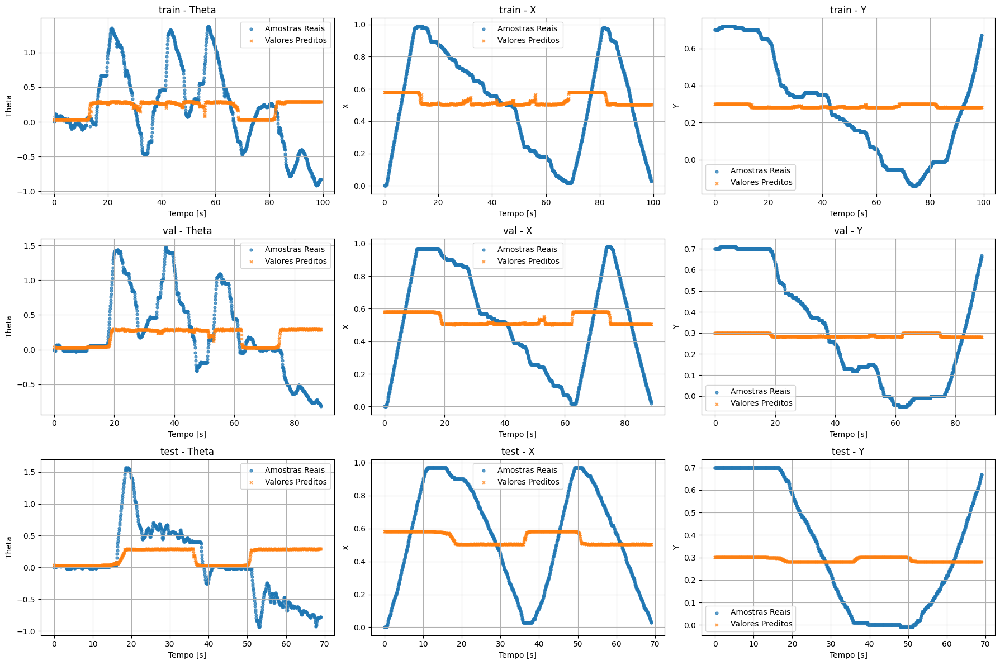

Modelo 0 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Theta | train -> R² = 0.0747, MSE = 3.0399e-01
X | train -> R² = 0.0021, MSE = 9.1942e-02
Y | train -> R² = 0.0039, MSE = 7.6576e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.0935, MSE = 2.9648e-01
X | val -> R² = 0.0059, MSE = 9.5205e-02
Y | val -> R² = -0.0150, MSE = 7.5623e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Theta | test -> R² = -0.0995, MSE = 3.1413e-01
X | test -> R² = 0.0003, MSE = 1.0192e-01
Y | test -> R² = -0.0461, MSE = 8.3357e-02


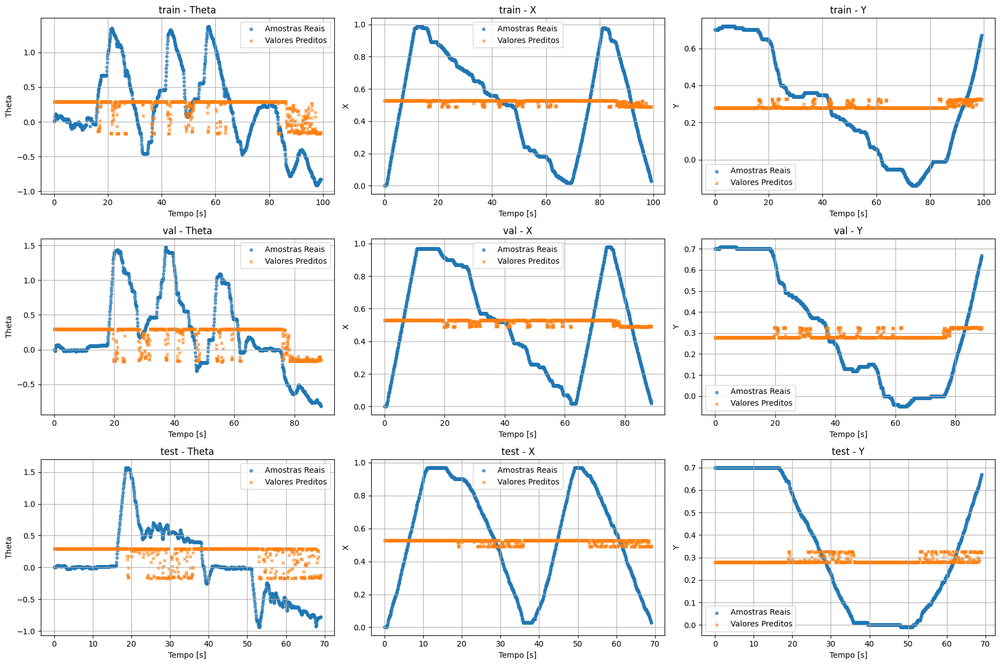

Modelo 1 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | train -> R² = 0.0758, MSE = 3.0363e-01
X | train -> R² = 0.0017, MSE = 9.1974e-02
Y | train -> R² = 0.0042, MSE = 7.6554e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0910, MSE = 2.9731e-01
X | val -> R² = 0.0055, MSE = 9.5237e-02
Y | val -> R² = -0.0150, MSE = 7.5622e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0964, MSE = 3.1326e-01
X | test -> R² = -0.0019, MSE = 1.0214e-01
Y | test -> R² = -0.0479, MSE = 8.3501e-02


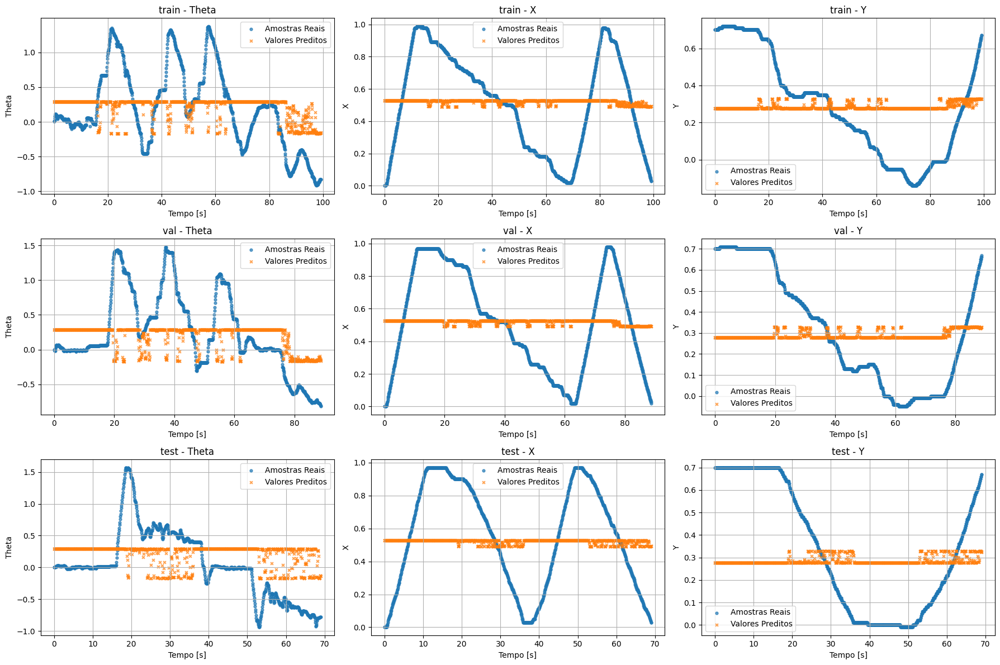

Modelo 2 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | train -> R² = 0.0444, MSE = 3.1394e-01
X | train -> R² = 0.0047, MSE = 9.1700e-02
Y | train -> R² = 0.0008, MSE = 7.6809e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0543, MSE = 3.0931e-01
X | val -> R² = -0.0050, MSE = 9.6249e-02
Y | val -> R² = -0.0028, MSE = 7.4718e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Theta | test -> R² = -0.0841, MSE = 3.0973e-01
X | test -> R² = 0.0030, MSE = 1.0164e-01
Y | test -> R² = -0.0276, MSE = 8.1885e-02


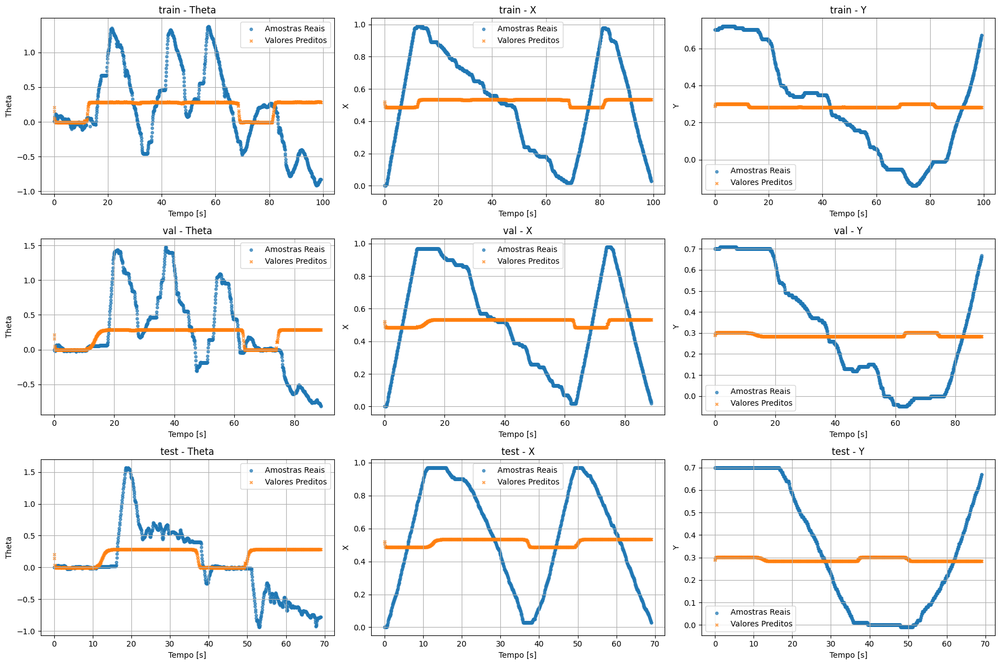

Modelo 3 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | train -> R² = 0.0256, MSE = 3.2015e-01
X | train -> R² = -0.0249, MSE = 9.4428e-02
Y | train -> R² = -0.0179, MSE = 7.8246e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Theta | val -> R² = 0.0498, MSE = 3.1078e-01
X | val -> R² = 0.0113, MSE = 9.4680e-02
Y | val -> R² = 0.0482, MSE = 7.0918e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.1165, MSE = 3.1901e-01
X | test -> R² = -0.0348, MSE = 1.0550e-01
Y | test -> R² = 0.0045, MSE = 7.9325e-02


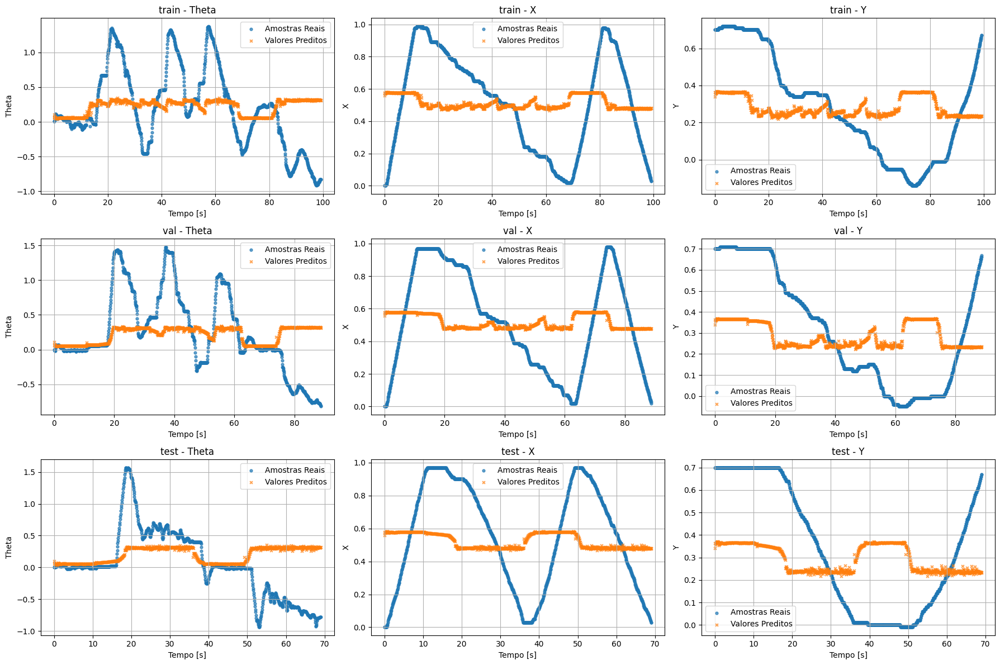

Modelo 4 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | train -> R² = 0.0498, MSE = 3.1219e-01
X | train -> R² = 0.0267, MSE = 8.9670e-02
Y | train -> R² = 0.0661, MSE = 7.1790e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0643, MSE = 3.0605e-01
X | val -> R² = -0.0211, MSE = 9.7788e-02
Y | val -> R² = 0.0540, MSE = 7.0482e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.1025, MSE = 3.1501e-01
X | test -> R² = -0.0223, MSE = 1.0422e-01
Y | test -> R² = 0.0398, MSE = 7.6514e-02


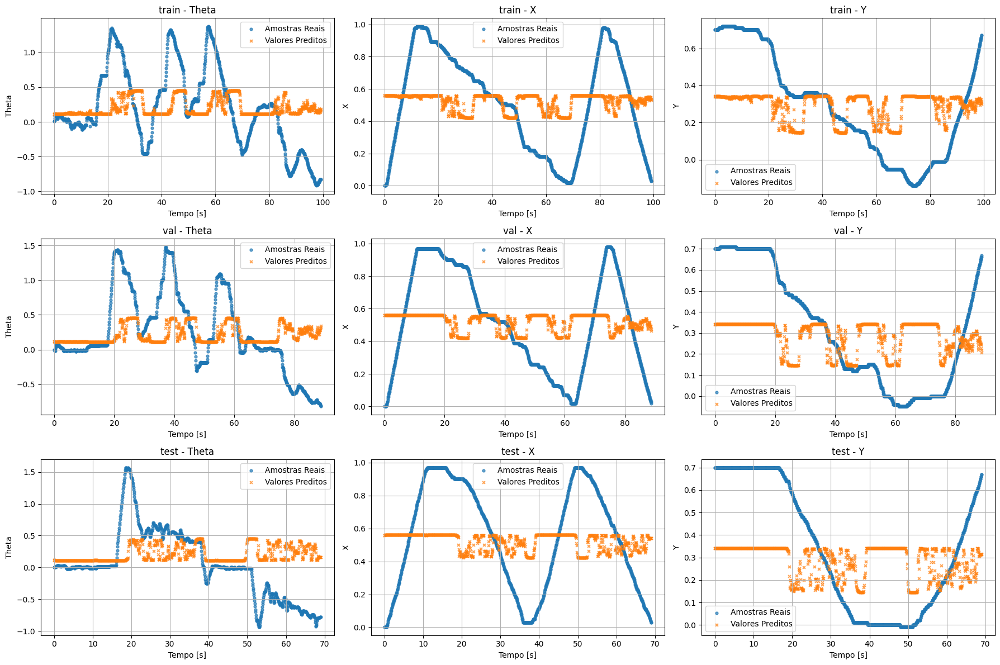

Modelo 5 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | train -> R² = 0.0225, MSE = 3.2116e-01
X | train -> R² = 0.0242, MSE = 8.9901e-02
Y | train -> R² = 0.0421, MSE = 7.3636e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0678, MSE = 3.0490e-01
X | val -> R² = -0.0231, MSE = 9.7982e-02
Y | val -> R² = 0.0466, MSE = 7.1037e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.1078, MSE = 3.1652e-01
X | test -> R² = -0.0362, MSE = 1.0563e-01
Y | test -> R² = 0.0455, MSE = 7.6060e-02


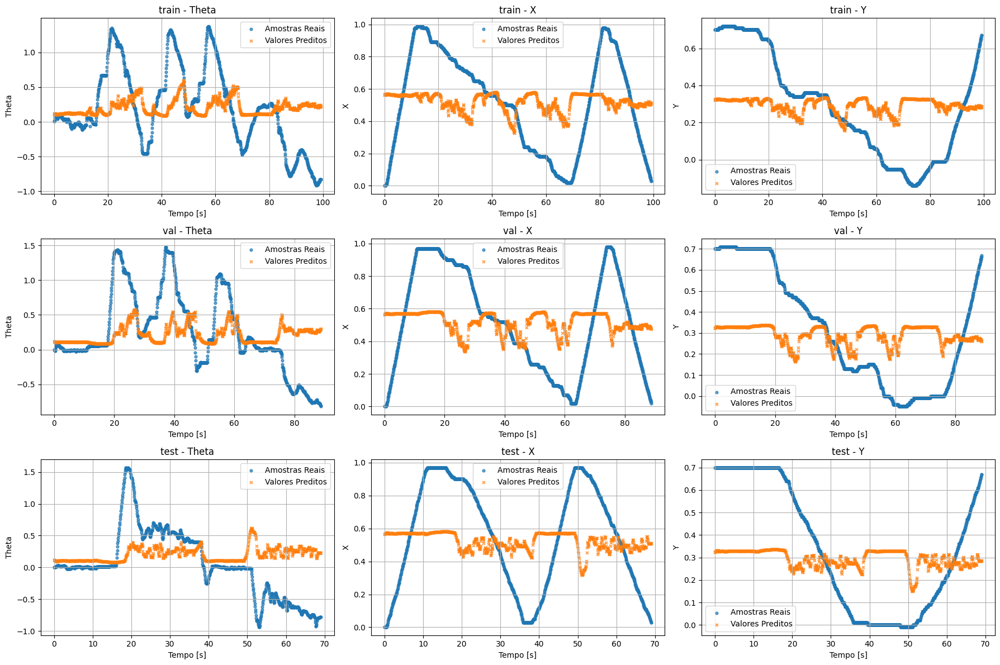

Modelo 6 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | train -> R² = 0.0080, MSE = 3.2590e-01
X | train -> R² = 0.0171, MSE = 9.0552e-02
Y | train -> R² = 0.0405, MSE = 7.3759e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0223, MSE = 3.1978e-01
X | val -> R² = 0.0074, MSE = 9.5055e-02
Y | val -> R² = 0.0810, MSE = 6.8476e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0776, MSE = 3.0790e-01
X | test -> R² = 0.0150, MSE = 1.0042e-01
Y | test -> R² = 0.1092, MSE = 7.0985e-02


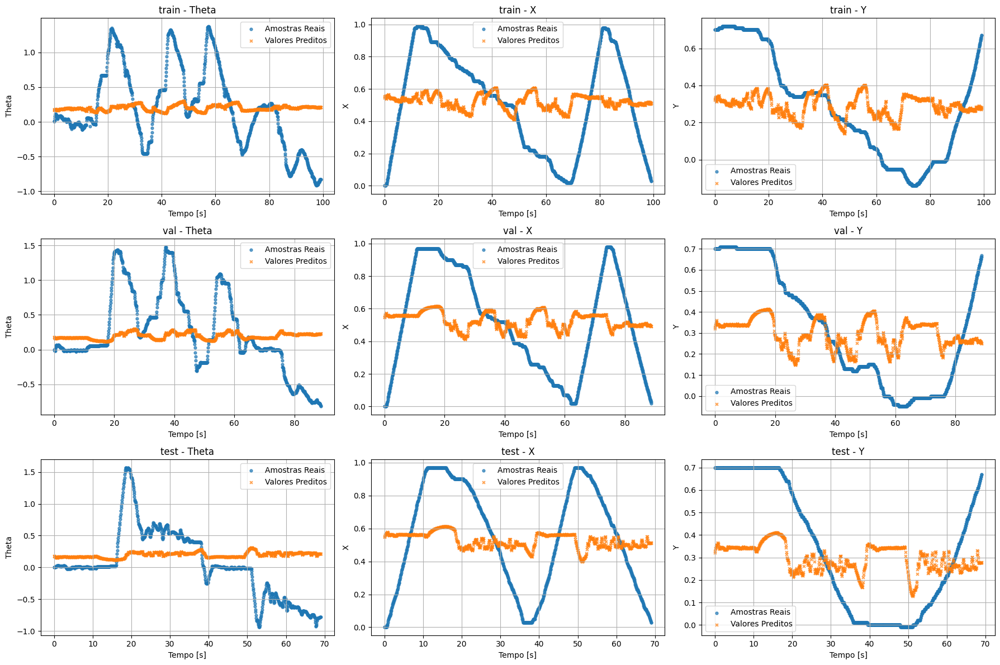

Modelo 7 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Theta | train -> R² = 0.0036, MSE = 3.2736e-01
X | train -> R² = 0.0155, MSE = 9.0703e-02
Y | train -> R² = 0.0372, MSE = 7.4017e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0131, MSE = 3.2279e-01
X | val -> R² = 0.0145, MSE = 9.4375e-02
Y | val -> R² = 0.0855, MSE = 6.8139e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0830, MSE = 3.0942e-01
X | test -> R² = 0.0221, MSE = 9.9696e-02
Y | test -> R² = 0.1159, MSE = 7.0453e-02


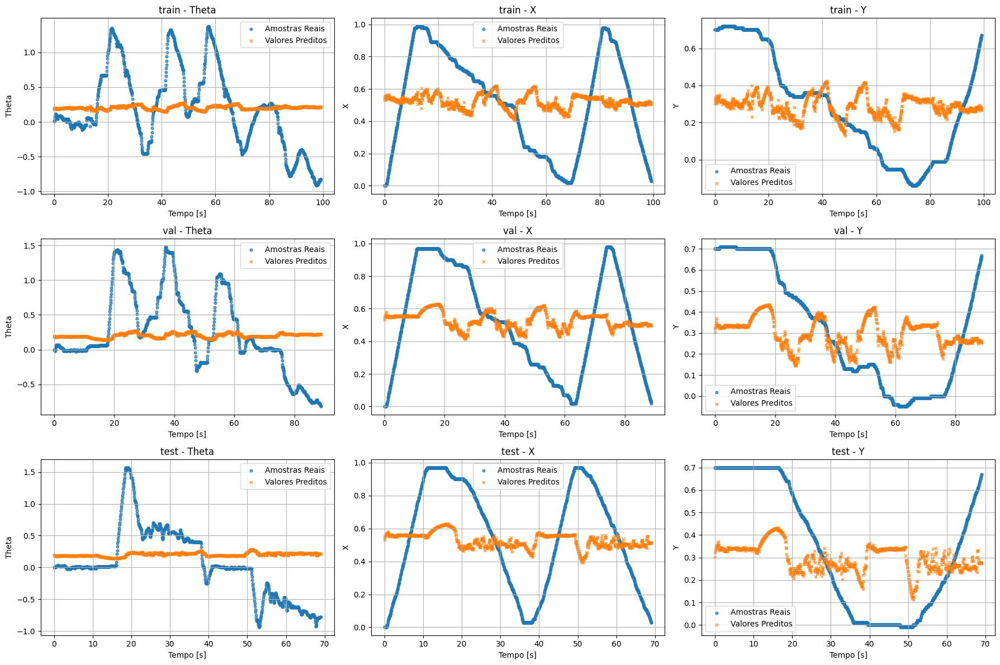

Modelo 8 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Theta | train -> R² = 0.0125, MSE = 3.2445e-01
X | train -> R² = 0.0105, MSE = 9.1161e-02
Y | train -> R² = 0.0324, MSE = 7.4383e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0384, MSE = 3.1452e-01
X | val -> R² = 0.0121, MSE = 9.4605e-02
Y | val -> R² = 0.0682, MSE = 6.9427e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | test -> R² = -0.0926, MSE = 3.1219e-01
X | test -> R² = 0.0045, MSE = 1.0149e-01
Y | test -> R² = 0.0694, MSE = 7.4152e-02


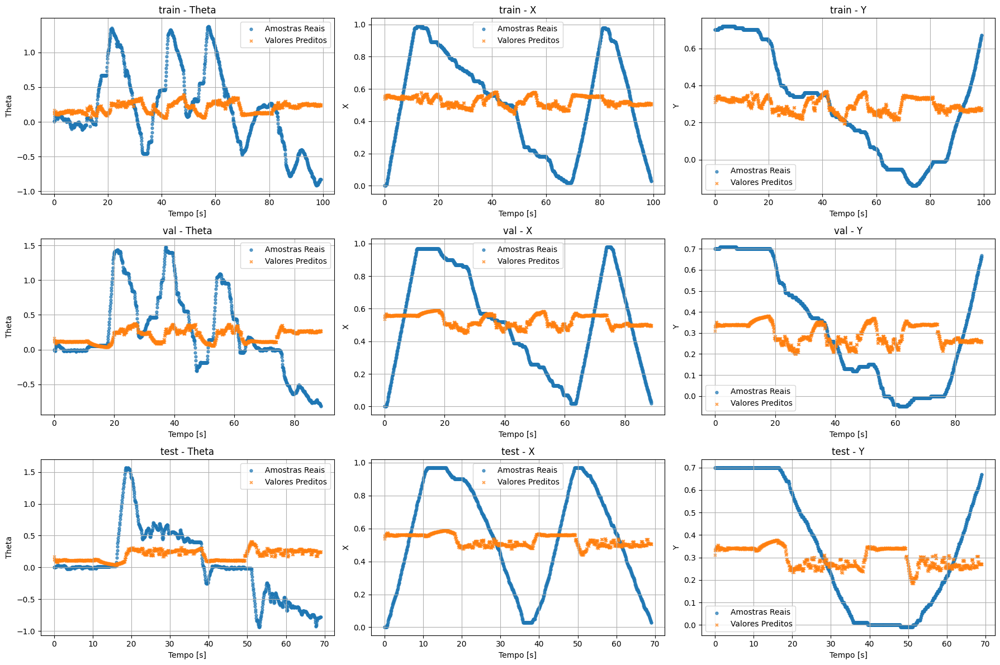

Modelo 9 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.1323, MSE = 2.8509e-01
X | train -> R² = 0.0124, MSE = 9.0993e-02
Y | train -> R² = 0.0741, MSE = 7.1175e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.1301, MSE = 2.8453e-01
X | val -> R² = 0.0322, MSE = 9.2684e-02
Y | val -> R² = 0.1244, MSE = 6.5240e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.2006, MSE = 3.4303e-01
X | test -> R² = -0.0026, MSE = 1.0222e-01
Y | test -> R² = 0.0083, MSE = 7.9021e-02


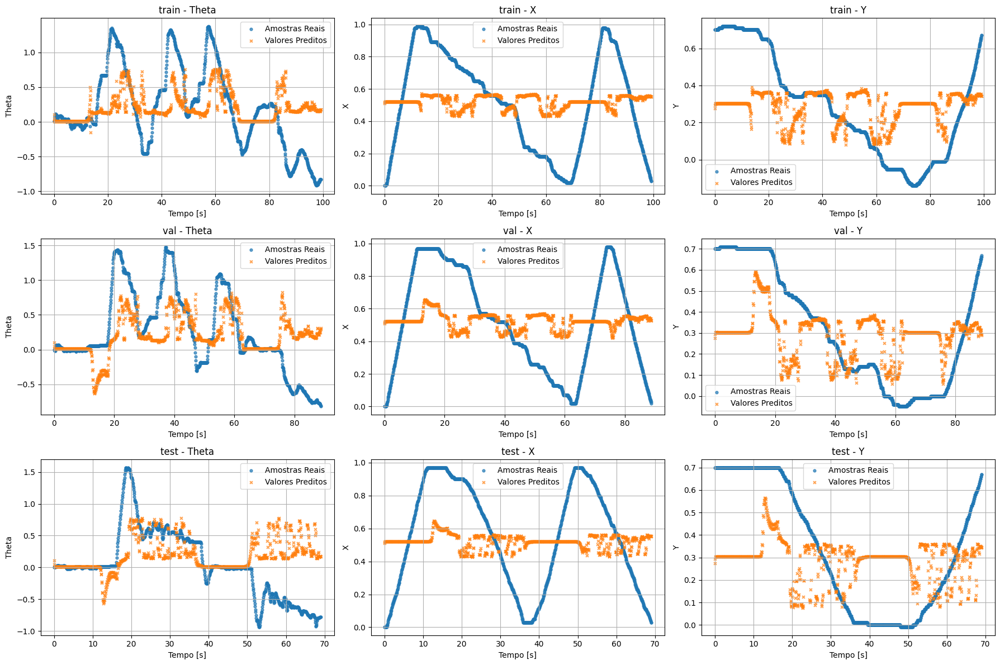

Modelo 0 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.0222, MSE = 3.2126e-01
X | train -> R² = 0.0452, MSE = 8.7968e-02
Y | train -> R² = 0.0355, MSE = 7.4143e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = -0.0034, MSE = 3.2817e-01
X | val -> R² = 0.0679, MSE = 8.9261e-02
Y | val -> R² = 0.1021, MSE = 6.6897e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.0832, MSE = 3.0949e-01
X | test -> R² = 0.0711, MSE = 9.4703e-02
Y | test -> R² = 0.1363, MSE = 6.8820e-02


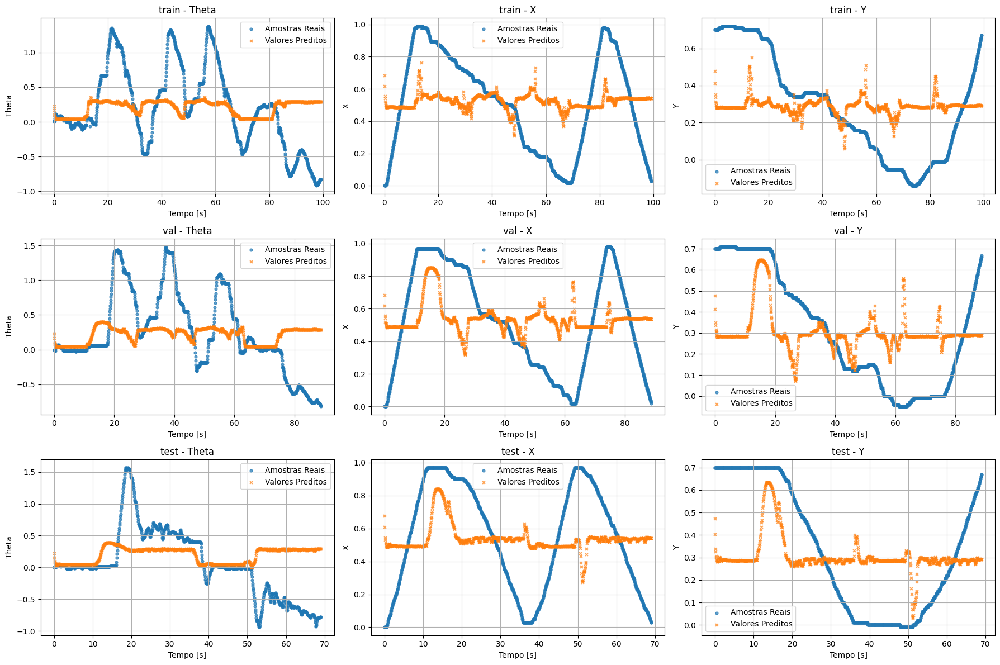

Modelo 1 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.0969, MSE = 2.9672e-01
X | train -> R² = 0.0097, MSE = 9.1237e-02
Y | train -> R² = 0.0812, MSE = 7.0628e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.1131, MSE = 2.9008e-01
X | val -> R² = -0.0016, MSE = 9.5921e-02
Y | val -> R² = 0.0608, MSE = 6.9977e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Theta | test -> R² = -0.1111, MSE = 3.1745e-01
X | test -> R² = 0.0098, MSE = 1.0095e-01
Y | test -> R² = -0.0470, MSE = 8.3430e-02


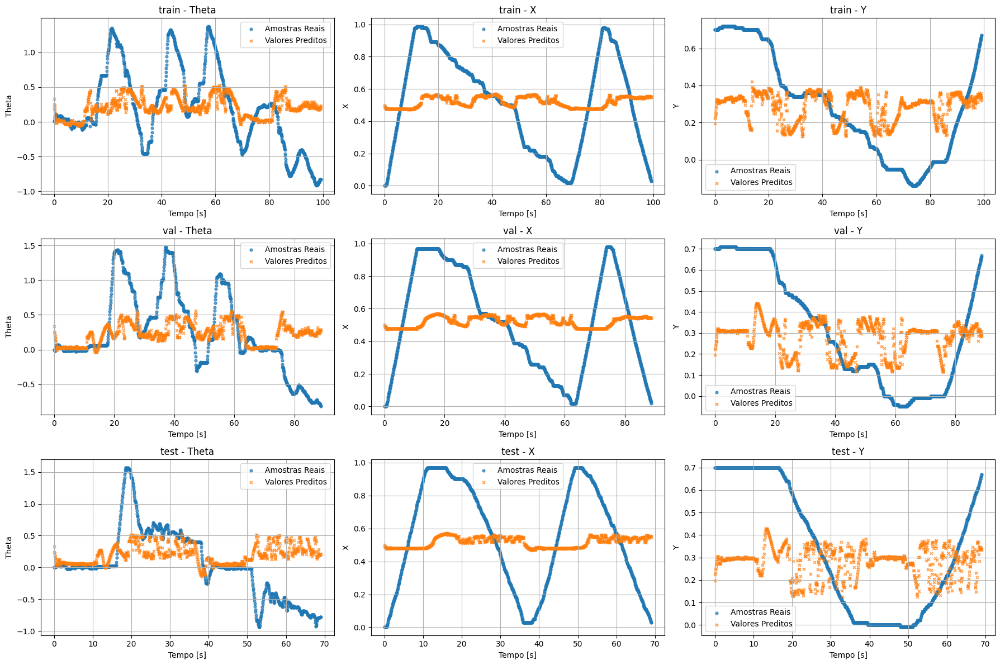

Modelo 2 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Theta | train -> R² = 0.0903, MSE = 2.9887e-01
X | train -> R² = 0.0156, MSE = 9.0690e-02
Y | train -> R² = 0.0561, MSE = 7.2564e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0910, MSE = 2.9731e-01
X | val -> R² = 0.0101, MSE = 9.4797e-02
Y | val -> R² = 0.0787, MSE = 6.8645e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.1323, MSE = 3.2351e-01
X | test -> R² = 0.0181, MSE = 1.0010e-01
Y | test -> R² = 0.0393, MSE = 7.6555e-02


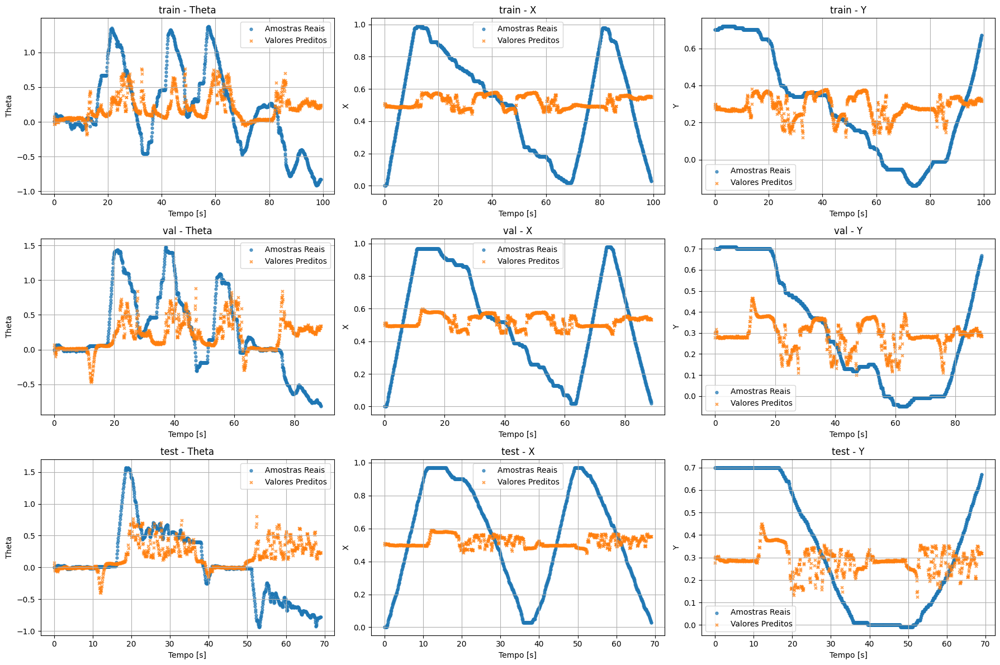

Modelo 3 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.1662, MSE = 2.7395e-01
X | train -> R² = 0.0019, MSE = 9.1956e-02
Y | train -> R² = 0.0226, MSE = 7.5134e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.2736, MSE = 2.3757e-01
X | val -> R² = -0.0148, MSE = 9.7187e-02
Y | val -> R² = 0.0024, MSE = 7.4333e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Theta | test -> R² = -0.0444, MSE = 2.9839e-01
X | test -> R² = -0.0121, MSE = 1.0318e-01
Y | test -> R² = -0.0589, MSE = 8.4375e-02


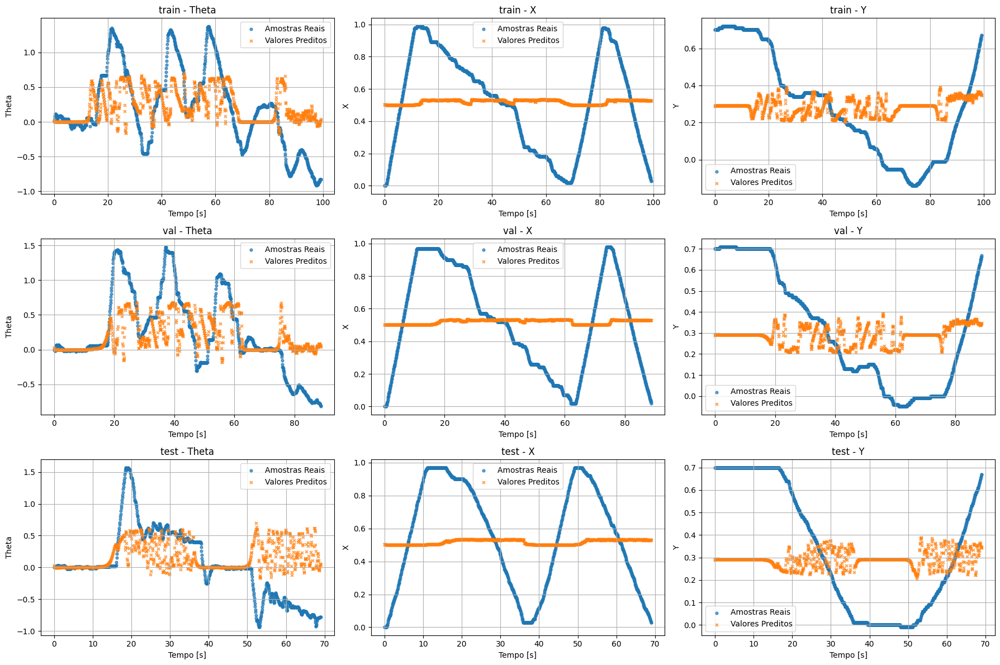

Modelo 4 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.0506, MSE = 3.1193e-01
X | train -> R² = 0.0080, MSE = 9.1394e-02
Y | train -> R² = 0.0265, MSE = 7.4840e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0559, MSE = 3.0878e-01
X | val -> R² = -0.0059, MSE = 9.6330e-02
Y | val -> R² = 0.0081, MSE = 7.3907e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.0306, MSE = 2.9447e-01
X | test -> R² = -0.0091, MSE = 1.0288e-01
Y | test -> R² = 0.0083, MSE = 7.9023e-02


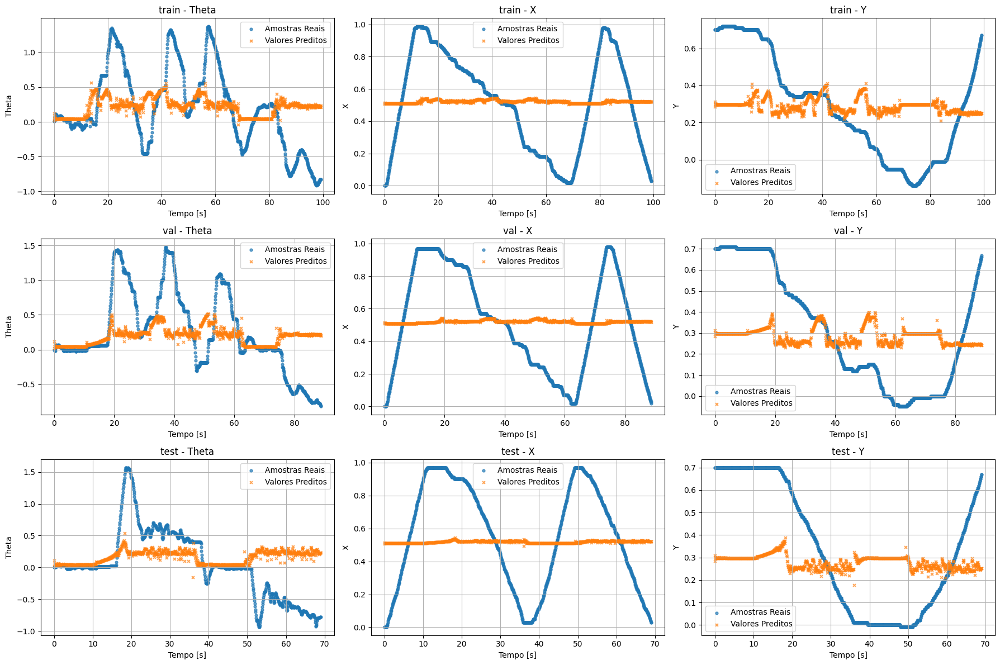

Modelo 5 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.0102, MSE = 3.2519e-01
X | train -> R² = 0.0103, MSE = 9.1186e-02
Y | train -> R² = 0.0342, MSE = 7.4247e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.0302, MSE = 3.1719e-01
X | val -> R² = 0.0133, MSE = 9.4495e-02
Y | val -> R² = 0.0776, MSE = 6.8725e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.0871, MSE = 3.1060e-01
X | test -> R² = 0.0069, MSE = 1.0124e-01
Y | test -> R² = 0.0873, MSE = 7.2726e-02


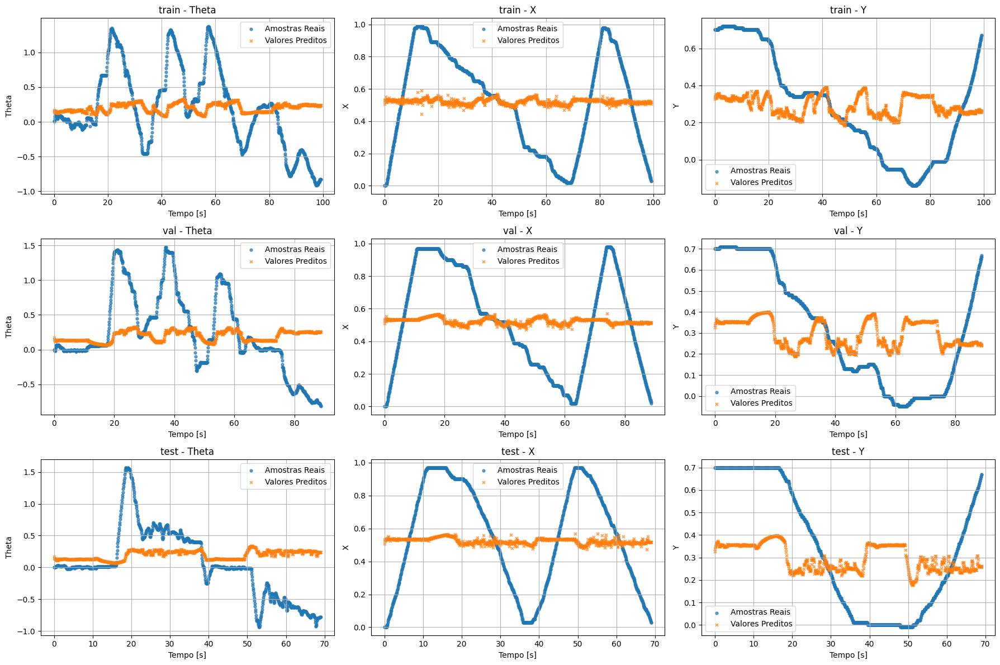

Modelo 6 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Theta | train -> R² = 0.0436, MSE = 3.1420e-01
X | train -> R² = 0.0172, MSE = 9.0547e-02
Y | train -> R² = 0.0345, MSE = 7.4223e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0359, MSE = 3.1534e-01
X | val -> R² = 0.0075, MSE = 9.5053e-02
Y | val -> R² = 0.0688, MSE = 6.9380e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Theta | test -> R² = -0.0754, MSE = 3.0726e-01
X | test -> R² = 0.0440, MSE = 9.7464e-02
Y | test -> R² = 0.1157, MSE = 7.0467e-02


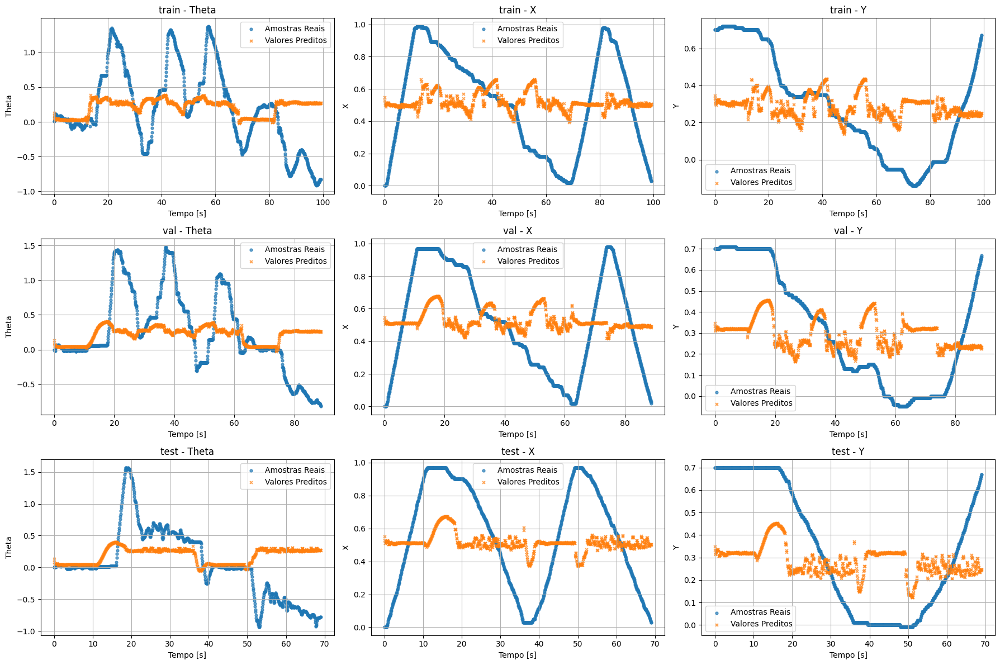

Modelo 7 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Theta | train -> R² = 0.1405, MSE = 2.8238e-01
X | train -> R² = 0.0117, MSE = 9.1050e-02
Y | train -> R² = 0.0781, MSE = 7.0866e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.1421, MSE = 2.8061e-01
X | val -> R² = 0.0210, MSE = 9.3757e-02
Y | val -> R² = 0.1149, MSE = 6.5950e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.2327, MSE = 3.5221e-01
X | test -> R² = -0.0039, MSE = 1.0234e-01
Y | test -> R² = 0.0210, MSE = 7.8009e-02


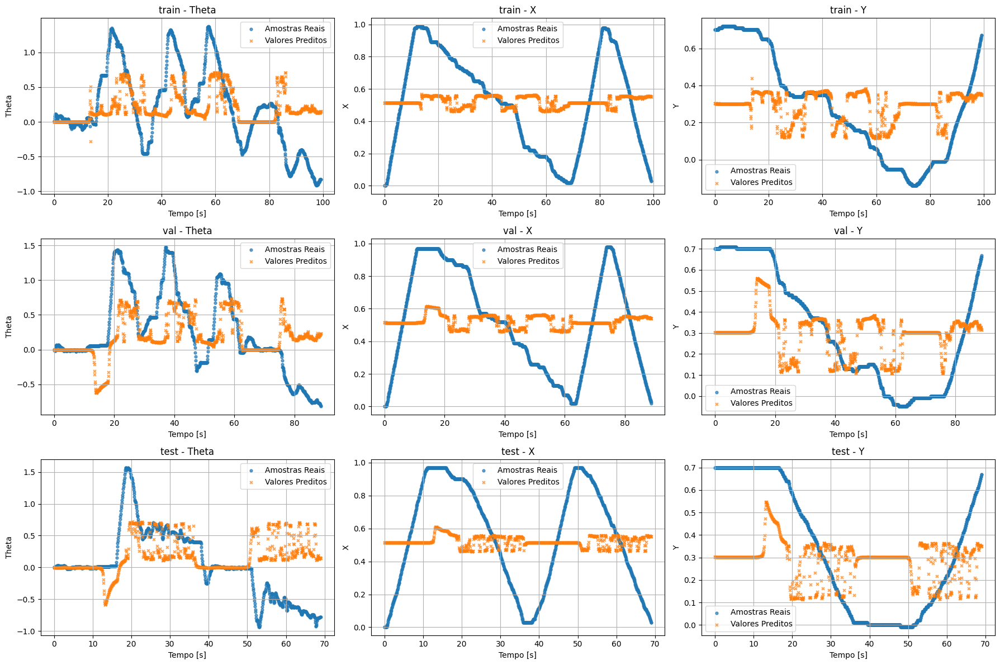

Modelo 8 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.1460, MSE = 2.8058e-01
X | train -> R² = 0.0678, MSE = 8.5886e-02
Y | train -> R² = 0.0083, MSE = 7.6233e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.1934, MSE = 2.6382e-01
X | val -> R² = 0.0596, MSE = 9.0055e-02
Y | val -> R² = 0.0134, MSE = 7.3507e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Theta | test -> R² = 0.0069, MSE = 2.8374e-01
X | test -> R² = 0.0544, MSE = 9.6398e-02
Y | test -> R² = -0.0150, MSE = 8.0881e-02


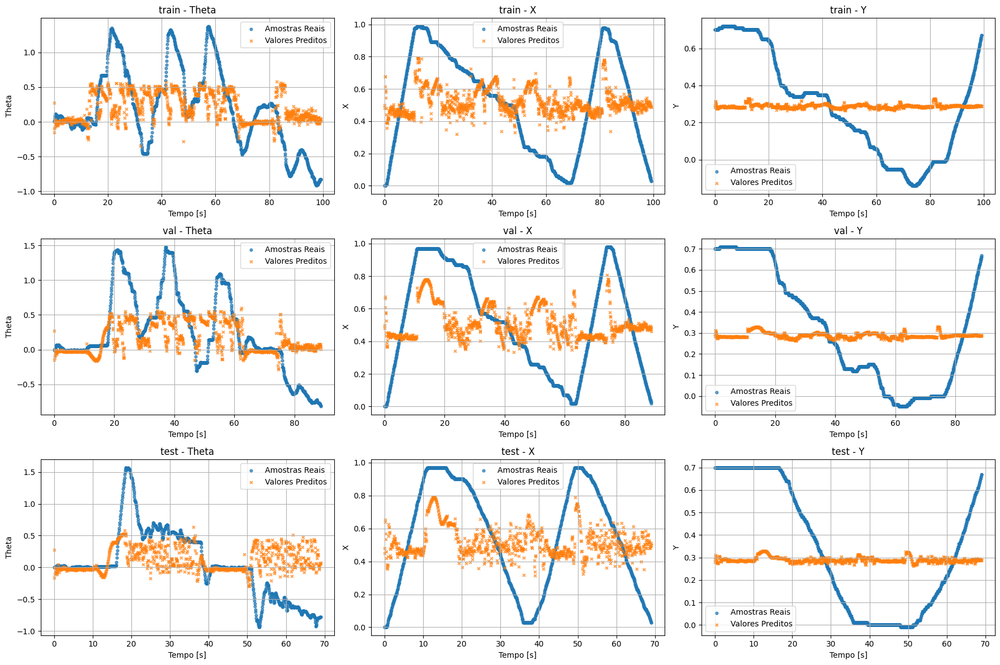

Modelo 9 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.1571, MSE = 2.7693e-01
X | train -> R² = 0.0143, MSE = 9.0817e-02
Y | train -> R² = 0.0427, MSE = 7.3590e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.2252, MSE = 2.5341e-01
X | val -> R² = 0.0425, MSE = 9.1701e-02
Y | val -> R² = 0.0519, MSE = 7.0641e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Theta | test -> R² = -0.0925, MSE = 3.1214e-01
X | test -> R² = 0.0211, MSE = 9.9795e-02
Y | test -> R² = 0.0081, MSE = 7.9043e-02


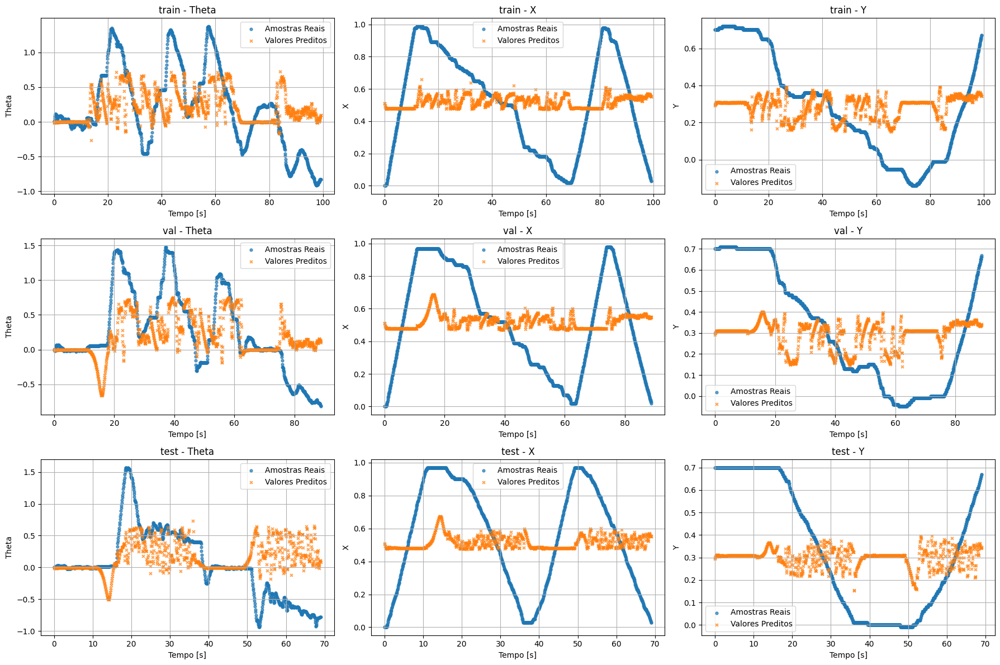

Modelo 0 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Theta | train -> R² = 0.0637, MSE = 3.0760e-01
X | train -> R² = 0.0650, MSE = 8.6140e-02
Y | train -> R² = 0.0454, MSE = 7.3386e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0676, MSE = 3.0496e-01
X | val -> R² = 0.0053, MSE = 9.5255e-02
Y | val -> R² = 0.0680, MSE = 6.9441e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.0556, MSE = 3.0162e-01
X | test -> R² = 0.0149, MSE = 1.0043e-01
Y | test -> R² = 0.0546, MSE = 7.5334e-02


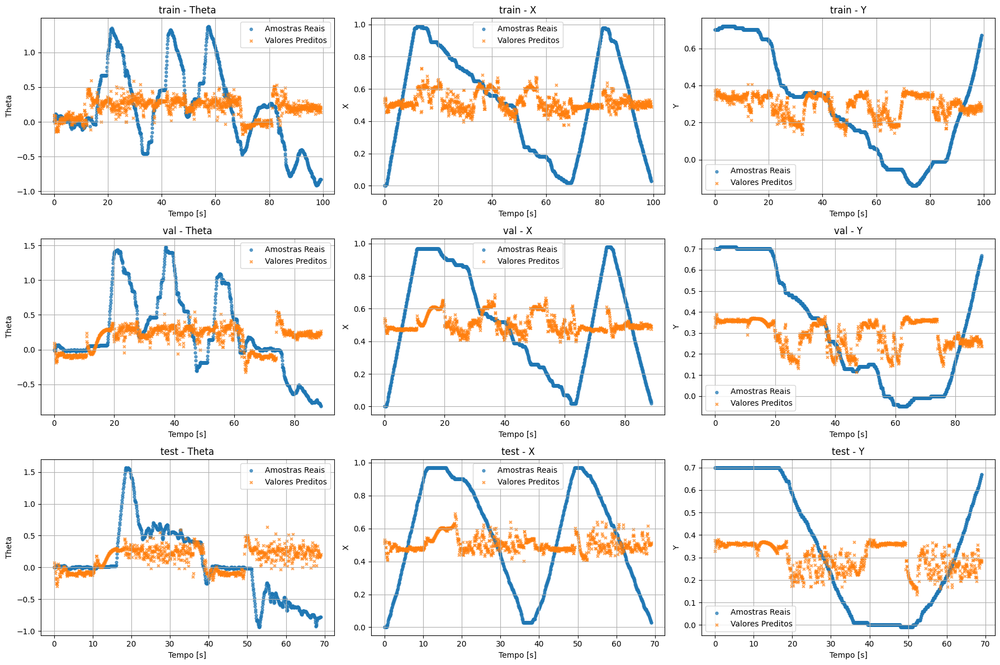

Modelo 1 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Theta | train -> R² = 0.1423, MSE = 2.8179e-01
X | train -> R² = 0.0713, MSE = 8.5562e-02
Y | train -> R² = 0.0656, MSE = 7.1829e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.1959, MSE = 2.6299e-01
X | val -> R² = 0.0104, MSE = 9.4771e-02
Y | val -> R² = 0.0543, MSE = 7.0459e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Theta | test -> R² = -0.0553, MSE = 3.0152e-01
X | test -> R² = 0.0301, MSE = 9.8878e-02
Y | test -> R² = 0.0495, MSE = 7.5743e-02


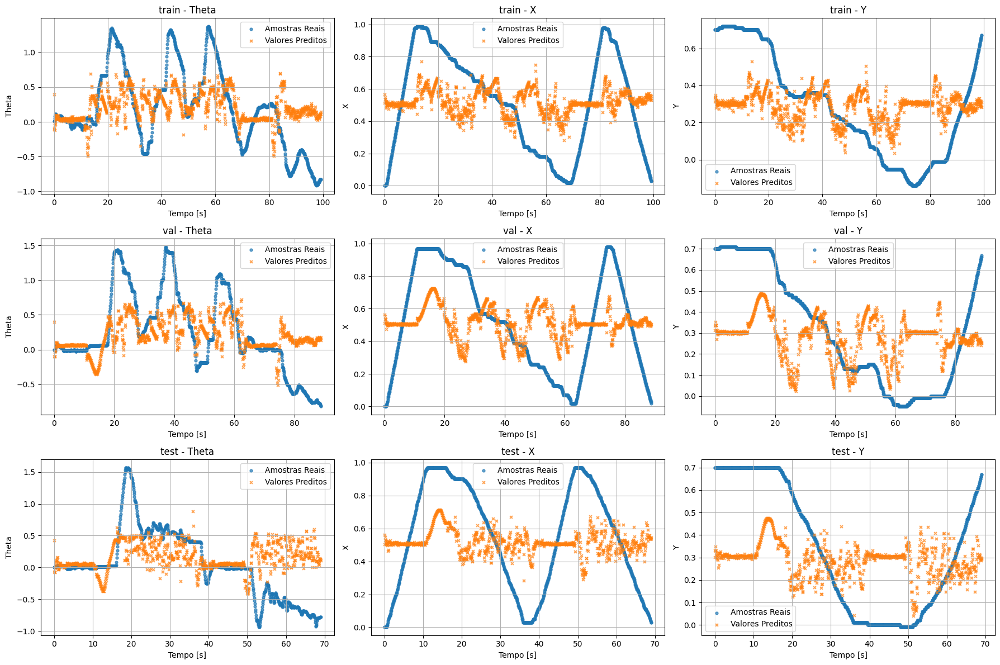

Modelo 2 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.0581, MSE = 3.0945e-01
X | train -> R² = 0.0631, MSE = 8.6313e-02
Y | train -> R² = 0.0553, MSE = 7.2623e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0776, MSE = 3.0168e-01
X | val -> R² = -0.0299, MSE = 9.8631e-02
Y | val -> R² = 0.0181, MSE = 7.3160e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Theta | test -> R² = -0.0983, MSE = 3.1382e-01
X | test -> R² = 0.0078, MSE = 1.0115e-01
Y | test -> R² = 0.0535, MSE = 7.5420e-02


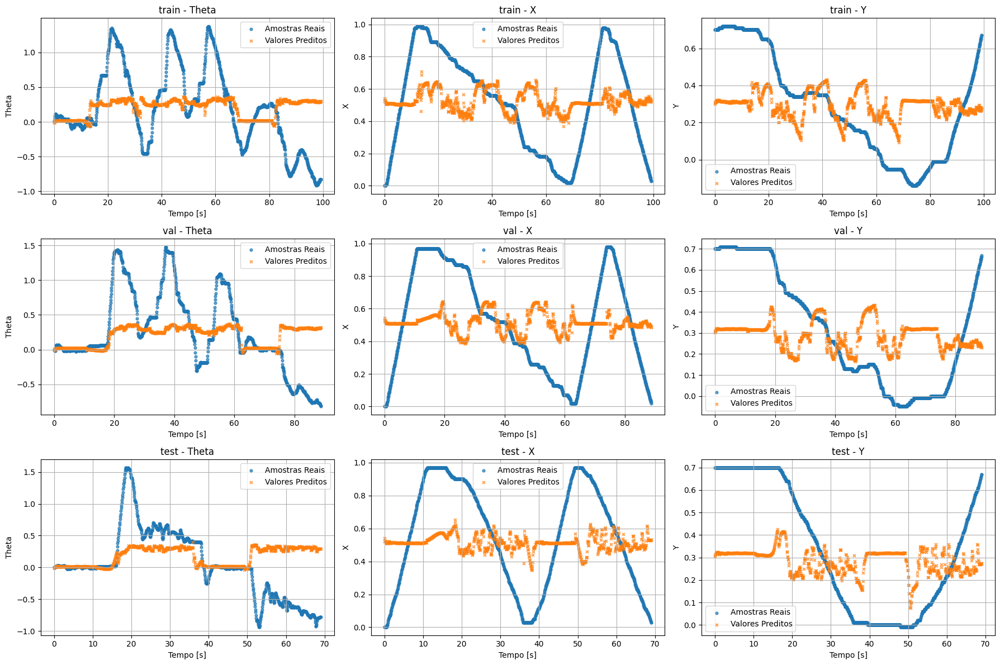

Modelo 3 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Theta | train -> R² = 0.0262, MSE = 3.1994e-01
X | train -> R² = 0.0168, MSE = 9.0585e-02
Y | train -> R² = 0.0272, MSE = 7.4782e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.0398, MSE = 3.1404e-01
X | val -> R² = 0.0077, MSE = 9.5031e-02
Y | val -> R² = 0.1010, MSE = 6.6979e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Theta | test -> R² = -0.0838, MSE = 3.0965e-01
X | test -> R² = 0.0250, MSE = 9.9400e-02
Y | test -> R² = 0.1213, MSE = 7.0021e-02


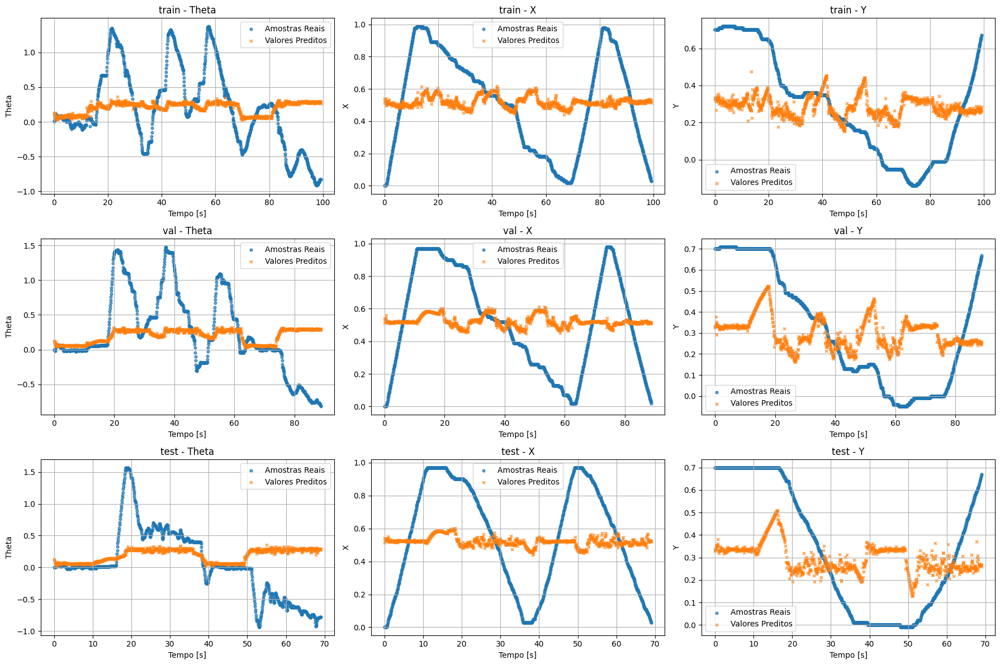

Modelo 4 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Theta | train -> R² = 0.1698, MSE = 2.7276e-01
X | train -> R² = 0.0713, MSE = 8.5563e-02
Y | train -> R² = 0.0765, MSE = 7.0992e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Theta | val -> R² = 0.2583, MSE = 2.4258e-01
X | val -> R² = -0.0034, MSE = 9.6090e-02
Y | val -> R² = 0.0351, MSE = 7.1896e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | test -> R² = -0.0121, MSE = 2.8917e-01
X | test -> R² = 0.0344, MSE = 9.8437e-02
Y | test -> R² = 0.0452, MSE = 7.6086e-02


In [ ]:
import numpy as np
import pandas as pd
from tensorflow import keras
from keras.callbacks import EarlyStopping
from keras import initializers

# tamanho da entrada
INPUT_SIZE = len(PREDICTORS)  
OUTPUT_SIZE = len(TARGET) 
N_MODELS = 10  # número de inicializações

seeds = np.random.choice(range(1, 10000), size=N_MODELS, replace=False)
neurons = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 19, 20, 21, 22, 23, 24, 25]
results = {}
excel_file = "resultados.xlsx"

for n in neurons:
    for i, s in enumerate(seeds):

        initializer = initializers.RandomNormal(seed=int(s))

        # cria modelo
        model = keras.models.Sequential([
            keras.layers.Input(shape=(TIME_STEPS, INPUT_SIZE)),
            keras.layers.SimpleRNN(n, activation="tanh"),
            keras.layers.Dense(OUTPUT_SIZE, activation="linear"),  
        ])
        
        # salva pesos iniciais
        w0 = model.get_weights()

        # compila
        model.compile(loss="mean_squared_error", optimizer="adam")
        early_stopping_monitor = EarlyStopping(
            monitor='val_loss',
            patience=50,
            restore_best_weights=True
        )

        # treina
        history = model.fit(
            x_train, 
            y_train, 
            epochs=500,
            callbacks=[early_stopping_monitor],
            validation_data=(x_val, y_val),
            verbose=0
        )

        # salva pesos finais
        wf = model.get_weights()

       # avalia o modelo
        metrics = EvalModel(model)

        row = {
            "model": f"model_{n}_{i}",
            "Neurons": n,
            # ---- Pesos ----
            "W0": str([w.round(4).tolist() for w in w0]),
            "Wf": str([w.round(4).tolist() for w in wf]),
        }

        for name in TARGET:
            row.update({
                f"R2_Train_{name}": metrics[name]["R2_train"],
                f"MSE_Train_{name}": metrics[name]["MSE_train"],
                f"R2_Val_{name}": metrics[name]["R2_val"],
                f"MSE_Val_{name}": metrics[name]["MSE_val"],
                f"R2_Test_{name}": metrics[name]["R2_test"],
                f"MSE_Test_{name}": metrics[name]["MSE_test"],
            })

        df = pd.DataFrame([row])

        # salva/atualiza Excel incrementalmente
        try:
            # tenta abrir existente e adicionar linha
            old = pd.read_excel(excel_file)
            new_df = pd.concat([old, df], ignore_index=True)
            new_df.to_excel(excel_file, index=False)
        except FileNotFoundError:
            # se não existir, cria arquivo novo
            df.to_excel(excel_file, index=False)

        print(f"Modelo {i} treinado e salvo no Excel")